#Data science for Economics final assignment

NAME = "Damiano Truzzi"

COLLABORATORS = "Matthias Proschinger"

|Name|SNR|ANR|
|----|---|----|
|Damiano Truzzi|2035467|u307192|
|Matthias Proschinger|2046061|u562252|

# Table of contents
## 1. Research question
## 2. Motivation
## 3. Method and data
## 4. Main assumptions
## 5. Preview of the answers
## 6. Python code
## 7. Robustness analysis
## 8. Discussion and conclusion



# Research question

How accurately can a neural network trained on data obtained from satellite imagery predict the severity of wildfires in Australia?

# Motivation
## Introduction
When reports of the massive Australian wildfire season 2019-2020 caused international breaking news, the world was once again reminded that global warming causes non-negligible transformation of the atmospheric conditions (Running, 2006; Hantson et al., 2015). The fires destroyed an estimated [18.6 million hectares](https://www.busseltonmail.com.au/story/6620313/it-was-a-line-of-fire-coming-at-us-firefighters-return-home/), [around 5.900 buildings](https://www.canberratimes.com.au/story/6574563/australias-2019-20-bushfire-season/) and killed at least [33 people](https://www.theguardian.com/australia-news/2020/jan/24/bushfires-death-toll-rises-to-33-after-body-found-in-burnt-out-house-near-moruya). Additionally, according to an ecologist of the University of Sydney, Australia's rich and unique wildlife lost around an estimated [one billion animals](https://www.sydney.edu.au/news-opinion/news/2020/01/08/australian-bushfires-more-than-one-billion-animals-impacted.html). Overall, approximated costs of the bushfires are said to exceed [$4.4bn](https://www.theguardian.com/australia-news/2020/jan/08/economic-impact-of-australias-bushfires-set-to-exceed-44bn-cost-of-black-saturday), causing an economic [downturn of 0.2%](https://www.rba.gov.au/speeches/2020/sp-gov-2020-02-05.html).

While the fires were still propagating, coverage on media and social media had been [accompanied](https://docs.google.com/document/d/1qOaMseNeTYdpFNpJivfi8WrUVDnjHEsfHp6igmpq57A/edit?ts=5eaef03e#) by misleading and misinterpreted images and maps about size and / or location of wildfires. Most notably, amongst others, [this](https://pro2-bar-s3-cdn-cf.myportfolio.com/65da487c728e9ec14e26fa6d6fe00528/1d67036d-4d96-4578-914e-a441600a11bf.jpg?h=ece687b3fc5513b8631a7547553aba76) visualization of one month's worth of Australian fire data being interpreted as one concurrent fire image. Machine learning techniques can play an important role in potential fire control (Collins et al., 2018; Romanescu, 2020). This work should thus support a better understanding on the severity of fires at certain locations and where the most devastating fires usually occur to aid local governments in deploying their resources where they are most needed.

# Method and data

To tackle the research question, we use fire, wind and vegetation data. This data is clearned, pre-processed and fed into a neural network. For in-depth explanations on conducted work please consult the code section.

## Fires

The fires dataset was obtained from the Fire Information For Resource Management System ([FIRMS](https://https://firms.modaps.eosdis.nasa.gov/)). The data ranges from 2012-01-20 to 2020-02-07 and is provided by NASA. The dataset contains relevant information such as fire brightness (measured in Kelvin), which is a measure of the photons at a particular wavelength received by the satellite which can be roughly translated to fire strength, the day in which the fire was active, latitude and longitude and other relevant information. Some features were dropped, such as "version", "instrument" and "track".

We perform different encodings on brightness, which is the target variable (renamed "categorical"), confidence, which reflects the probability of a true positive and day / night, which is a binary variable indicating at which time the fire has been captured by the satellite.

To be able to merge wind data onto fire data, we cluster fire points based on their location and their brightness level. This is done using k-means clustering, which is a method to divide $n$ observations into $k$ groups by minimising within-class variance (MacQueen, 1967).

## Wind

Wind data is scraped from the [National Weather Service/National Centers for Environmental Prediction](https://nomads.ncep.noaa.gov/) website and contains wind components (U wind and V wind) as well as date, latitude and longitude. Wind components are converted into wind speeds and wind directions using the trigonometry formulas presented below.

$wind\ speed\ =\ \sqrt{(u^{2}+v^{2})}$.

$wind\ direction\ = 270\ -\ (atan2(v,\ u)\times \dfrac{180}{\pi})\ \%\ 360$.

Wind data is included in our analysis to improve predictions based on wind patterns and fire propagation patterns.

## Vegetation

Because fire propagation and fire strength also depend on their environment, vegetation data is included to strengthen the analysis. This dataset contains geometrical information about native vegetation areas in Australia, more specifically, mangrove, rainforest and forest or shrub and where they are located within the country.

This data is obtained from the [Geoscience Australia](https://ecat.ga.gov.au/geonetwork/srv/eng/catalog.search#/metadata/64058) section of the Australian Government website.

To merge both datasets, we determine whether fire points are located within a vegetation area.

## The use of neural networks

We are aware of the effect that winds and vegetation areas have on fire propagation and fire strength. However, this relation is most likely very complex and non-linear. Moreover, our variables do not follow any of the standard data distributions. We therefore leverage the power of Neural Networks to learn hidden relationships in the data without imposing unrealistic assumptions. For example, we cannot linearly infer that a denser vegetation translates to a stronger fire but we may be able to infer, using NN, that this relation depends on the type of vegetation.

Moreover, deep neural networks are better at handling more features and more advanced data connections whereas it would be difficult e.g. for a decision tree to output similar results. Furthermore, deep neural networks allow for regularization and dropout that translate into higher efficiency. Finally, the size of the dataset we had access to could only benefit from leveraging the power of NN.

# Preview of the answers

Using fire data, wind data and vegetation data to train a neural network, we find that it is possible to achieve very high accuracy (97.4%) and a small loss (0.066) in predicting the severity of a wildfire in Australia with a notably low rate of false positives and negatives, according to the presented confusion matrix.

![alt text](https://i.imgur.com/LpJ4aeT.png)

# Main assumptions

- We assumed, using rules of thumb based on [this](https://towardsdatascience.com/17-rules-of-thumb-for-building-a-neural-network-93356f9930af) article, that the baseline model would be able to achieve maximum performance given the data it was fed to. Those assumptions were the following : Three hidden layers with 64, 32 and 16 neurons respectively and relu activation functions, an output layer of 9 neurons and softmax activation function, no dropout and adam optimiser.

- Brightness temperature refers to the strength of a fire. This assumption is derived from [this](https://www.researchgate.net/figure/Fire-intensity-observations-in-relation-to-the-4-mm-brightness-temperatures-from-MODIS_fig3_248977407) figure (Kaufman et al., 2003) and [this](https://www.researchgate.net/publication/260010654_The_New_VIIRS_375_m_active_fire_detection_data_product_Algorithm_description_and_initial_assessment/link/5bce0c16299bf1a43d994862/download) paper (Schroeder et al., 2014).

- Data manipulation and data pre-processing is assumed not to generate real-life misrepresentation e.g. we assume that k-means clustering regroups the data accordingly.

- A lot of research was done to portray the current situation of Australia as accurately as possible. However, assumptions have been made regarding the validity of the used data as well as the relation between the variables e.g we assume that there is a inherent difference in vegetation area types so that they burn and propagate differently.

# Python code

## Package installation

NOTE TO THE READER : If you are interested in running the code by yourself, please use the most powerful machine at your disposal i.e. > 35GB RAM and high CPU core count. This project was reaslised using Google Colab Pro and will not be able to be ran otherwise.

In the following code chunck, we install a few crucial libraries that are needed for later.

Basemap is used to plot our results, pygrib is used to open .grib files, geopandas is used to read .gpd datasets, hyperas is a wrapper for hyperopt, which is used for hyperparameter tuning. The other libraries are used as dependences.

We set the random seed to a specific value so our results are able to be reproduced.

In [ ]:
!sudo apt-get install libgeos-dev
!sudo pip install https://github.com/matplotlib/basemap/archive/master.zip
!sudo apt install libeccodes-dev
!pip3 install pygrib
!pip install geocoder
!pip install geopandas
!sudo apt install python3-rtree
!pip install hyperas

|                          	| Function                                                                                                                                                      	|
|--------------------------	|---------------------------------------------------------------------------------------------------------------------------------------------------------------	|
| GoogleDriveDownloader    	| Used to download our datasets that we cached on Drive **to improve loading performance  **                                                                                                                                 	|
| Pickle                   	| Used to store temporary files                                                                                                                                 	|
| Basemap                  	| Converts longitude/latitude into x/y and plot those points onto maps                                                                                          	|
| Requests / BeautifulSoup 	| Both are used to web scrape wind components (u_wind and v_wind) from the National Centers for Environmental Information                                       	|
| Tensorflow               	| Backend used for machine learning                                                                                                                             	|
| Shapely                  	| We use Polygon and Point to convert long/lat to POINTS to allow for easier merging between datasets                                                           	|
| Keras                    	| Deep learning open-source library for neural network models creation                                                                                          	|
| Sklearn (Scikit-learn)   	| KMeans is used to cluster the fire dataset as well as merge fires and wind datasets. SKlearn also allows for data manipulation and confusion matrix creation. 	|
| Hyperopt                 	| It is a library for serial and parallel optimisation. We use the "[Tree of Parzen](https://papers.nips.cc/paper/4443-algorithms-for-hyper-parameter-optimization.pdf)" (Bergstra et al., 2011) estimator algorithm.                                                        	|
| Seaborn                  	| Plotting confusion matrix.                                                                                                                                    	|

In [ ]:
from google_drive_downloader import GoogleDriveDownloader as gdd
import glob
import pandas as pd
import numpy as np
from numpy import argmax
import matplotlib.pyplot as plt
import pickle
from mpl_toolkits.basemap import Basemap
from pylab import rcParams
from sklearn.cluster import KMeans
import pygrib
import urllib.request
import matplotlib.colors as colors
import requests
from bs4 import BeautifulSoup
import geocoder
from sklearn.utils import shuffle
import geopandas as gpd
import rtree
import tensorflow as tf
from shapely.geometry import Polygon, Point
from geopandas.tools import sjoin
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from keras.utils import np_utils, to_categorical
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.pipeline import Pipeline
from tensorflow.python.keras.layers import Dense
from tensorflow.python.keras import Sequential
from sklearn.compose import ColumnTransformer
from tensorflow.keras.callbacks import EarlyStopping
import hyperas
from hyperas import optim
from hyperopt import Trials, STATUS_OK, tpe
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.models import Sequential, model_from_json
from keras.layers.convolutional import Convolution2D, MaxPooling2D
from keras.optimizers import Adam
from hyperas.distributions import choice, uniform
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.utils.class_weight import compute_sample_weight
import folium
from folium.plugins import MarkerCluster
from branca.element import Template, MacroElement
import os
from numpy.random import seed
from tensorflow.random import set_seed
seed(1)
tf.random.set_seed(1234)

key = '8bf52ec9744b68'

%matplotlib inline

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Data loading and pre-processing

### Fire data
The fires dataset was obtained from Fire Information For Resource Management System ([FIRMS](https://https://firms.modaps.eosdis.nasa.gov/)). It distributes near real-time active fire data within three hours of satellite observation. The data is provided by NASA and was obtained by request. The data ranges from 2012-01-20 to 2020-02-07.





For our convenience, we uploaded the .csv to Google Drive so to allow for faster access and to avoid any down-time when reading the data because of the size of the dataset (~10m rows).

In [ ]:
#Unmodified fires dataset
gdd.download_file_from_google_drive(file_id='1BZaBrTAQ2mFmODPPzwSbEXMky5zHRUNE',
                                    dest_path='./df_fires/mnist.zip',
                                    unzip=True)
path = r'/content/df_fires'
all_files = glob.glob(path + "/*.csv")
for filename in all_files:
    data = pd.concat((pd.read_csv(f) for f in all_files), sort=False)

Unzipping...Done.


In [ ]:
data.head(5)

,latitude,longitude,bright_ti4,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_ti5,frp,type,daynight
0,-32.75695,116.40399,335.5,0.80,0.78,2012-01-20,710,N,VIIRS,n,1,290.9,5.4,0.0,NaN
1,-19.08704,138.30238,306.3,0.67,0.74,2012-01-20,1503,N,VIIRS,n,1,290.1,2.2,0.0,NaN
2,-19.76707,147.39275,304.0,0.54,0.42,2012-01-20,1503,N,VIIRS,n,1,290.7,1.1,0.0,NaN
3,-19.77295,147.38081,306.2,0.54,0.42,2012-01-20,1503,N,VIIRS,n,1,290.7,1.1,0.0,NaN
4,-19.13356,139.37115,315.6,0.58,0.69,2012-01-20,1503,N,VIIRS,n,1,292.6,1.6,0.0,NaN


Within this dataset, some variables are not useful to our purpose. Therefore, we do not drop "coordinates" (longitude, latitude) because we want to know where the fires are located, "bright_ti4" which indicates the brightness intensity (measured in Kelvin), which is a measure of the photons at a particular wavelength received by the satellite, which can be roughly translated to fire severity (the brighter the pixel, the stronger the fire), "acq_time" (hour) and "acq_date" (month / day / year) to determine when the fires are happening and "confidence" which translates how likely a datapoint is a true positive.

In [ ]:
for key in data:
  if (key != 'latitude' and key != 'longitude' and
      key != 'bright_ti4' and key != 'acq_time' and
      key != 'acq_date' and key != 'confidence'):
   data = data.drop([key], axis=1)
df_fires = data.reset_index().drop('index', axis = 1).rename(columns={'acq_time' : 'day_night'})

In this code chunck, we convert the time of day into a binary variable (day / night) to better suit our needs.

This distinction is made to help the neural network in understanding that, at night, fires are more likely to be detected. Moreover, a fire marked as a low-confidence fire is more likely to indeed be a fire, rather than a sun glint (explained in the next cell). The following [figure](https://earthdata.nasa.gov/faq/firms-faq) helps to understand the different probabilities of fire detection during the day and night.

![alt text](https://cdn.earthdata.nasa.gov/conduit/upload/951/firms_daynight.jpg)


In [ ]:
time = df_fires['day_night'].values
for i in range(len(time)):
  if len(str(time[i])) == 3:
    if str(time[i])[:1] < '6':
      time[i]=0
    else:
      time[i]=1
  elif len(str(time[i])) == 4:
    if str(time[i])[:2] >='18':
      time[i]=0
    else:
      time[i]=1



The brightness temperature of a fire will be the dependent variable and is converted into an ordinal variable to classify fire severity with our neural network. The scale is derived from Schroeder et al., (2014).

We decided to use a scale from 1 to 9 where '1' is either a weak fire or a sunglint, i.e. a phenomenon in which the sunlight reflects off the surface of the water at the same angle that the satellite is viewing the surface and '9' is the strongest possible fire.

In [ ]:
df_fires['categorical'] = df_fires['bright_ti4']
f = df_fires['categorical'].values
for i in range(0, len(f)):
  if f[i]<295:
    f[i]=1 #Weakest fire or sun glint
  elif 295<=f[i]<306:
    f[i]=2
  elif 306<=f[i]<316:
    f[i]=3
  elif 316<=f[i]<326:
    f[i]=4
  elif 326<=f[i]<336:
    f[i]=5
  elif 336<=f[i]<346:
    f[i]=6
  elif 346<=f[i]<356:
    f[i]=7
  elif 356<=f[i]<367:
    f[i]=8
  elif f[i]>=367:
    f[i]=9 #Strongest fire

In [ ]:
df_fires[df_fires['categorical']==1]['confidence'].value_counts()

l    9591
Name: confidence, dtype: int64

Low, nominal and high confidence are converted into an ordinal variable to better help the neural network understand the ordinal ranking.

Each fire point has a degree of confidence which can either be low, nominal or high. Low confidence are [typically](https://earthdata.nasa.gov/earth-observation-data/near-real-time/firms/viirs-i-band-active-fire-data) associated with areas of sun glint and lower temperature. Moreover, it can be seen from the cell below that most fires with a brightness lower than 300 are considered low confidence. Therefore, we infer from this website as well as from the cell below that a share of fire points with low brightness and low confidence could most likely be sun glint rather than true fires.

In [ ]:
f = df_fires['confidence'].values
for i in range(0, len(f)):
  if f[i]=='l': #low
    f[i]=0
  elif f[i]=='n': #nominal
    f[i]=1
  elif f[i]=='h': #high
    f[i]=2

df_fires['confidence'] = df_fires['confidence'].astype(int)

Because we don't need the specific day nor year in which the fire occurred, we simply strip each row within "acq_date" of all other values but the month and merge it back as a standalone column, called "month" to enhance some sort of seasonality component as we believe that the fire season adopts a certain course over the year.

In [ ]:
df_fires['acq_date'] = df_fires['acq_date'].str.replace(r'\D', '')
a = []
time = df_fires['acq_date'].values
for i in range(len(time)):
  a.append(str(time[i])[4:6])

df_fires['month'] = pd.DataFrame(a)

We are interested to know where the fires are occuring between 2012 and 2019. We therefore plot a random sample of 10000 observations per year on a map.

This is done by delimiting the map to Australia using longitude and latitude. The latter two are then converted to x / y points on an orthogonal projection. Each year is then drawn onto the map, using a different colour.

Only the fires that are less likely to be sun glares or reflection are plotted. Therefore, the confidence variable must be strictly larger than 0, i.e. either "nominal" or "high".



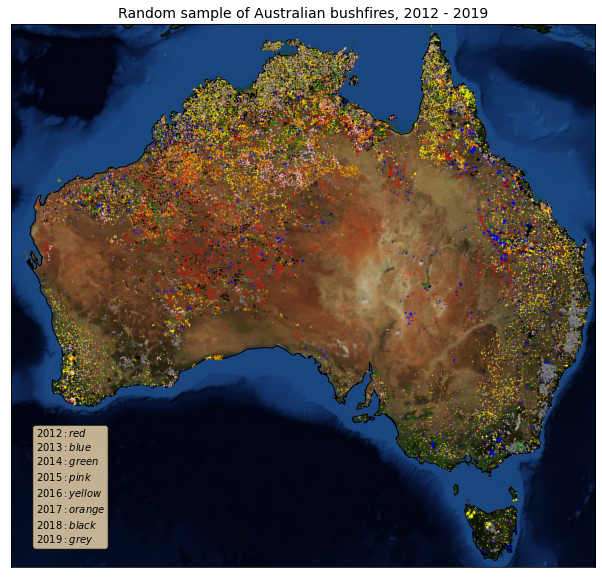

In [ ]:
rcParams['figure.figsize'] = (14,10)
llon, ulon, llat, ulat = 112, 154, -44, -10
my_map = Basemap(projection='merc', resolution = 'l', area_thresh = 1000.0,
                 llcrnrlon=llon, llcrnrlat=llat,  urcrnrlon=ulon, urcrnrlat=ulat)
my_map.drawcoastlines()
my_map.bluemarble();

xm, ym = my_map(np.asarray(df_fires.longitude), np.asarray(df_fires.latitude))
df_fires['xm']= xm.tolist()
df_fires['ym']= ym.tolist()

df_fires_conf = df_fires[df_fires['confidence']>0]

df_sample = pd.DataFrame(pd.concat(
    df_fires_conf[df_fires_conf['acq_date'].apply(lambda x: str(i) in x)].sample(n = 10000, axis = 0) for i in range(2012, 2020)))
y = ['red', 'blue', 'green', 'pink', 'yellow', 'orange', 'black', 'grey']

date = df_sample['acq_date'].values
xm = df_sample['xm'].values
ym = df_sample['ym'].values

for i, j in zip(range(len(y)), range(2012, 2020)):
  for k in range(len(df_sample)):
    if date[k][:4] == str(j):
      my_map.plot(xm[k], ym[k], markerfacecolor =str(y[i]), markeredgecolor=str(y[i]), marker='.', markersize= 1, alpha = 0.4)
    else:
      pass

plt.title("Random sample of Australian bushfires, 2012 - 2019", fontsize=14)
textstr = '\n'.join((r'$2012 : red$', r'$2013 : blue$', r'$2014 : green$', r'$2015 : pink$', r'$2016 : yellow$', r'$2017 : orange$', r'$2018 : black$', r'$2019 : grey$'))
plt.annotate(textstr, xy=(200000, 200000), xycoords='data', bbox = dict(boxstyle='round', facecolor='wheat', alpha=0.8))


plt.show()

From this map, we can see that only the center of the country is not plagued by wildfires. The regions that are the most hit are the coasts, where the vegetation is greener.

The following is the same as the previous one but is interactive. We encourage you to pan around. For this map, we were inspired by [this](https://walkenho.github.io/beergarden-happiness-with-python/) Github article and the legend was created and adapted using [this](http://nbviewer.jupyter.org/gist/talbertc-usgs/18f8901fc98f109f2b71156cf3ac81cd) Jupyter Notebook.

In [ ]:
df_fires_conf = df_fires[df_fires['confidence']>0]

df_sample = pd.DataFrame(pd.concat(df_fires_conf[df_fires_conf['acq_date'].apply(lambda x: str(i) in x)].sample(n = 2000, axis = 0) for i in range(2012, 2020)))
base_coords = (df_sample['latitude'].mean(), df_sample['longitude'].mean())

map = folium.Map(location=base_coords, zoom_start=4)

legend = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({start: function (event, ui) {$(this).css({right: "auto", top: "auto", bottom: "auto"});}});});

  </script>
</head>
<body>
 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Legend</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:red;opacity:0.7;'></span>2012</li>
    <li><span style='background:blue;opacity:0.7;'></span>2013</li>
    <li><span style='background:green;opacity:0.7;'></span>2014</li>
    <li><span style='background:pink;opacity:0.7;'></span>2015</li>
    <li><span style='background:yellow;opacity:0.7;'></span>2016</li>
    <li><span style='background:orange;opacity:0.7;'></span>2017</li>
    <li><span style='background:black;opacity:0.7;'></span>2018</li>
    <li><span style='background:white;opacity:0.7;'></span>2019</li>

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {text-align: left; margin-bottom: 5px; font-weight: bold; font-size: 90%;}
  .maplegend .legend-scale ul {margin: 0; margin-bottom: 5px; padding: 0; float: left; list-style: none;}
  .maplegend .legend-scale ul li {font-size: 80%; list-style: none; margin-left: 0; line-height: 18px; margin-bottom: 2px;}
  .maplegend ul.legend-labels li span {display: block; float: left; height: 16px; width: 30px; margin-right: 5px; margin-left: 0;
  border: 1px solid #999;}
  .maplegend .legend-source {font-size: 80%; color: #777; clear: both;}
  .maplegend a {color: #777;}
</style>
{% endmacro %}"""
macro = MacroElement()
macro._template = Template(legend)
map.get_root().add_child(macro)

red = MarkerCluster(name='2012').add_to(map)
blue = MarkerCluster(name='2013').add_to(map)
green = MarkerCluster(name='2014').add_to(map)
pink = MarkerCluster(name='2015').add_to(map)
yellow = MarkerCluster(name='2016').add_to(map)
orange = MarkerCluster(name='2017').add_to(map)
black = MarkerCluster(name='2018').add_to(map)
grey = MarkerCluster(name='2019').add_to(map)

for point in df_sample[df_sample['acq_date'].str.contains(str(2012))].iterrows():
    folium.Marker(location=[(point[1]['latitude']), (point[1]['longitude'])], icon=folium.Icon(color='red', prefix='fa')).add_to(red)
for point in df_sample[df_sample['acq_date'].str.contains(str(2013))].iterrows():
    folium.Marker(location=[(point[1]['latitude']), (point[1]['longitude'])], icon=folium.Icon(color='blue', prefix='fa')).add_to(blue)
for point in df_sample[df_sample['acq_date'].str.contains(str(2014))].iterrows():
    folium.Marker(location=[(point[1]['latitude']), (point[1]['longitude'])], icon=folium.Icon(color='green', prefix='fa')).add_to(green)
for point in df_sample[df_sample['acq_date'].str.contains(str(2015))].iterrows():
    folium.Marker(location=[(point[1]['latitude']), (point[1]['longitude'])], icon=folium.Icon(color='pink', prefix='fa')).add_to(pink)
for point in df_sample[df_sample['acq_date'].str.contains(str(2016))].iterrows():
    folium.Marker(location=[(point[1]['latitude']), (point[1]['longitude'])], icon=folium.Icon(color='yellow', prefix='fa')).add_to(yellow)
for point in df_sample[df_sample['acq_date'].str.contains(str(2017))].iterrows():
    folium.Marker(location=[(point[1]['latitude']), (point[1]['longitude'])], icon=folium.Icon(color='orange', prefix='fa')).add_to(orange)
for point in df_sample[df_sample['acq_date'].str.contains(str(2018))].iterrows():
    folium.Marker(location=[(point[1]['latitude']), (point[1]['longitude'])], icon=folium.Icon(color='black', prefix='fa')).add_to(black)
for point in df_sample[df_sample['acq_date'].str.contains(str(2019))].iterrows():
    folium.Marker(location=[(point[1]['latitude']), (point[1]['longitude'])], icon=folium.Icon(color='white', prefix='fa')).add_to(grey)

folium.LayerControl().add_to(map)    
display(map)

In this next chunck, we use the KMeans clustering algorithm to cluster data points that are close to each other and have similar brightness levels. We then save the data pre-processing as "final fires dataset". This step takes quite a long time to run (~ one hour). Please run the cell directly below it to skip this step.

In [ ]:
df_fires['acq_date'] = df_fires['acq_date'].astype(int)
f1, f2, f3 = df_fires['xm'].values, df_fires['ym'].values, df_fires['bright_ti4'].values
X = np.array(list(zip(f1, f2, f3)))
kmeans = KMeans(n_clusters=110)
kmeans = kmeans.fit(X)
labels = kmeans.predict(X)
C = kmeans.cluster_centers_

df_fires = pd.concat([df_fires.reset_index(), pd.DataFrame(labels, columns={'cluster'}).reset_index()], axis = 1).drop('index', axis = 1)
df_fires.to_csv('df_fires.csv')

In [ ]:
#Final fires dataset
gdd.download_file_from_google_drive(file_id='1Tkoct4uHnqQix--3CHi7WHgPX5F1ijpT',
                                    dest_path='./df_fires.csv')
df_fires = pd.read_csv('./df_fires.csv').drop(['Unnamed: 0'], axis=1)

After the completion of the KMeans clustering algorithm we use the same map of Australia as before for visualization. From matplotlib we import the color package. A linear space of colours is then created and the color for each observation will depend on its cluster. Each cluster is then plotted onto the map.

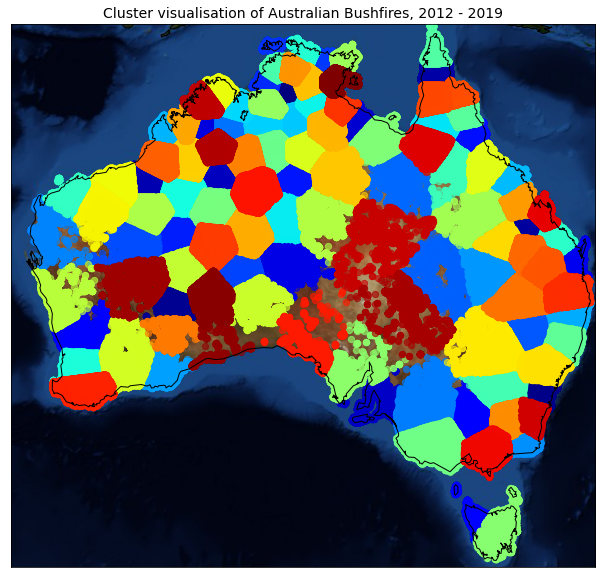

In [ ]:
labels = df_fires['cluster']
clusterNum = len(set(labels))
rcParams['figure.figsize'] = (14,10)
llon, ulon, llat, ulat=112, 154, -44, -10

my_map = Basemap(projection='merc', resolution = 'l', area_thresh = 1000.0,
                 llcrnrlon=llon, llcrnrlat=llat,  urcrnrlon=ulon, urcrnrlat=ulat)
my_map.drawcoastlines()
my_map.bluemarble();
colors = plt.get_cmap('jet')(np.linspace(0.0, 1.0, clusterNum))

for clust_number in set(labels):
    c=(colors[np.int(clust_number)])
    clust_set = df_fires[df_fires.cluster == clust_number]                    
    my_map.scatter(clust_set.xm, clust_set.ym, color =c,  marker='o', s= 40, alpha = 0.65)
plt.title(r"Cluster visualisation of Australian Bushfires, 2012 - 2019", fontsize=14)        
plt.show()

For all but the center of the country where we know that fires are scarse, it can be seen that the clusters are very well defined. This suggests that fire characteristics are very distinct between neighbouring clusters and that fine-tuned analyses should be prioritised rather than considering large portions of the country as a single cluster.

### Wind data

In the next cells, we web-scrape information provided by the [National Weather Service/National Centers for Environmental Prediction](https://nomads.ncep.noaa.gov/) about wind components, such as U wind, V wind and wind occurence to measure wind speeds and wind directions.

This first cell indicates the link to a data directory with archived wind data from 2004 up to 2020 and fetches the HTML structure of the website. We are interested in dates ranging from 2012 to 2019. The loop filters through the HTML coding and extracts the link of each of the years and months of interest. Each data directory (month and year) is stored onto a list (x).



In [ ]:
URL = 'https://nomads.ncdc.noaa.gov/data/gfsanl/'
res = requests.get(URL).text
soup = BeautifulSoup(res,'lxml')
x = []
for link in soup.find_all('a', href=True)[::2]:
    x.append(URL + link['href'])
x = x[97:193]
y = []
z = []
x[0:5]

['https://nomads.ncdc.noaa.gov/data/gfsanl/201201/',
 'https://nomads.ncdc.noaa.gov/data/gfsanl/201202/',
 'https://nomads.ncdc.noaa.gov/data/gfsanl/201203/',
 'https://nomads.ncdc.noaa.gov/data/gfsanl/201204/',
 'https://nomads.ncdc.noaa.gov/data/gfsanl/201205/']

The following cell runs through the list that we just created and for each entry of the list, it repeats same process as the previous cell, now fetching the day of each month of each year. The last two lines clean the data, i.e. they remove every character after either "?" or "//data".

In [ ]:
for i in range(len(x)):
  URL = x[i]
  res = requests.get(URL).text
  soup = BeautifulSoup(res,'lxml')
  for link in soup.find_all('a', href=True)[::2]:
    y.append(URL + link['href'])
y = [x for x in y if "?" not in x]
y = [x for x in y if "//data" not in x]

The first few lines of code verify that no other directory with the same name is already created.

The for loop goes through all the extracted links and downloads (using urllib.request.urlretrieve) a .GRB file (General Regularly-Distributed Information in Binary Form (GRIB); a common data format used in meteorology propagated by the World Meteorological Organization) which contains information about wind components. Every six hours, the Global Forecasting System of the US Agency "National Centers for Environmental Information" records wind components into a .GRB file. We decided to use the wind information that was recorded at 12pm.

On line 12, we select the files that have a very specific name structure, which corresponds to the entries of the previously saved list "y".

Using the library "Pygrib", which is needed to open GRIB files, we extract two specific variables named "10 metre U wind component" and "10 meter V wind component". Both are measured at 10 meters above ground.

The U wind and V wind components are vectors that are represented from 0 to 360 degrees and are utilized to calculate wind speeds and directions. The longitude must therefore be shifted by 180 degrees to match the fires dataset. To avoid extracting unnecessary data, we delimit the latitudes and longitudes to a rectangle around Australia.

So as to store all this information, we create two distinct dictionaries (d and e) to store U wind and V wind data. Each key correspond to a single day. To avoid running out of space, each file is deleted after the end of the process. This process is repeated for each day from early 2012 to end of 2019.

Finally, we use the Pickle library to dump the dictionnaries and save the progress. This cell takes more than four hours to run.

In [ ]:
path = "/content/wind"
try:
  os.mkdir(path)
except:
  pass
d = {}
e = {}
for i in range(len(y)):
  URL = y[i]
  res = requests.get(URL).text
  soup = BeautifulSoup(res,'lxml')
  for link in soup.find_all('a', href = 'gfsanl_3_'+str(y[i][-10:][1:][:-1])+'_1200_000.grb')[::2]:
    urllib.request.urlretrieve(URL + link['href'], '/content/wind/'+str(y[i][-10:][1:][:-1]+'.grb'))
    grbs = pygrib.open('/content/wind/'+str(y[i][-10:][1:][:-1]+'.grb'))
    try:
      u_wind = grbs.select(name='10 metre U wind component')[0]
      v_wind = grbs.select(name='10 metre V wind component')[0]
      for wind in [u_wind, v_wind]:
        data, lats, lons = wind.data(lat1 = llat,lat2 = ulat,lon1 = llon+180,lon2 = ulon+180)
        lats = lats.flatten()
        lons = lons.flatten()
        data = data.flatten()
        lats = pd.DataFrame(lats).rename(columns = {0 : 'latitude'})
        lons = pd.DataFrame(lons).rename(columns = {0 : 'longitude'}) - 180
        data = pd.DataFrame(data).rename(columns = {0 : 'data'})
        test = pd.concat([lats, lons, data], sort = False, axis = 1)
        if wind == u_wind:
          d[str(y[i][-10:][1:][:-1])] = test.rename(columns={'data' : 'u_wind'})
        else:
          e[str(y[i][-10:][1:][:-1])] = test.rename(columns={'data' : 'v_wind'})
      os.remove('/content/wind/'+str(y[i][-10:][1:][:-1]+'.grb'))
    except:
      pass

pickle.dump(d, open( "d.p", "wb" ))
pickle.dump(e, open( "e.p", "wb" ))

To convert U wind and V wind components to usable data, we pass each dictionary entry through a function that converts the existing data to wind speeds.

The formula is the following :

$wind\ speed\ =\ \sqrt{(u^{2}+v^{2})}$.

This is then stored in lists that will lated be appended to a dataframe.

In [ ]:
d = pickle.load(open( "d.p", "rb" ))
e = pickle.load(open( "e.p", "rb" ))

def wind_speed(x, y):
  return np.sqrt(np.square(x)+np.square(y))
wndspd = []
day = []
latitude = []
longitude = []
for key in d:
  for i in range(len(d[key]['u_wind'])):
    wndspd.append(wind_speed(d[key]['u_wind'][i], e[key]['v_wind'][i]))
    day.append(key)
    latitude.append(d[key]['latitude'][i])
    longitude.append(d[key]['longitude'][i])

To convert U wind and V wind components to usable data, we pass each dictionary entry through a function that converts the existing data to wind directions.

The formula is the following :

$wind\ direction\ = 270\ -\ (atan2(v,\ u)\times \dfrac{180}{\pi})\ \%\ 360$.

Additionally, we merge the data we have created into a new "wind" dataframe .

In [ ]:
def wind_dir(x, y):
  return (270-np.rad2deg(np.arctan2(y, x)))%360
wnddir = []
day = []
latitude = []
longitude = []
for key in d:
  for i in range(len(d[key]['u_wind'])):
    wnddir.append(wind_dir(d[key]['u_wind'][i], e[key]['v_wind'][i]))
    day.append(key)
    latitude.append(e[key]['latitude'][i])
    longitude.append(e[key]['longitude'][i])

wind = pd.merge(pd.DataFrame({'day wind' : day, 'latitude' : latitude, 'longitude' : longitude, 'wind speed' : wndspd}),
                pd.DataFrame({'wind direction' : wnddir, 'day wind' : day, 'latitude' : latitude, 'longitude' : longitude}))

To merge the fires and winds dataset on the correct location data, we create four new lists which contain the limits of each cluster, i.e. max latitude, max longitude, min latitude and min longitude.

We then pass each observation from the wind dataset in a for loop that determines whether observation $i$ is whithin cluster $j$. Then, the corresponding cluster is appended to each observation. The observations that do not belong to any cluster are dropped.

In [ ]:
lat_max = []
lat_min = []
lon_max = []
lon_min = []
for i in range(0, 110):
  lat_max.append(df_fires[df_fires['cluster']==i]['latitude'].max())
  lat_min.append(df_fires[df_fires['cluster']==i]['latitude'].min())
  lon_max.append(df_fires[df_fires['cluster']==i]['longitude'].max())
  lon_min.append(df_fires[df_fires['cluster']==i]['longitude'].min())

a = []
b = []
c = []
d = []
e = []
f = []

day_wind = wind['day wind'].values
latitude = wind['latitude'].values
longitude = wind['longitude'].values
wind_speed = wind['wind speed'].values
wind_dir = wind['wind direction'].values

for j in range(len(latitude)):
  for i in range(0, 110):
    if (lat_min[i] <= latitude[j] <= lat_max[i]) and (lon_min[i] <= longitude[j] <= lon_max[i]) == True:
        a.append(day_wind[j])
        b.append(wind_speed[j])
        c.append(wind_dir[j])
        d.append(i)
        e.append(latitude[j])
        f.append(longitude[j])

wind = pd.DataFrame({'day wind' : a, 'wind speed' : b,
                     'wind direction' : c, 'cluster' : d, 'latitude' : e, 'longitude' : f})
wind = wind.rename(columns={'day wind' : 'acq_date'})
wind['acq_date'] = wind['acq_date'].astype(int)

The cells above take very long to run (at least four hours), please consider downloading the final winds dataset instead, in the cell below.

In [ ]:
#Final winds dataset
gdd.download_file_from_google_drive(file_id='1-BHYv3sp-PcIHlThyWbINiCdX4l5QRjq',
                                    dest_path='./wind/wind.csv')
wind = pd.read_csv('./wind/wind.csv').drop(['Unnamed: 0'], axis=1)

This cell merges both datasets on cluster and acquired date. Then, it removes unwanted columns (longitude_y and latitude_y).

In [ ]:
df_fires = pd.merge(df_fires, wind, on = ['cluster', 'acq_date'])
df_fires = df_fires.groupby(by=['latitude_x', 'longitude_x']).mean()
df_fires['categorical'] = np.round(df_fires['categorical'], 0)
df_fires = df_fires.reset_index()
df_fires = df_fires.drop(['latitude_y', 'longitude_y'], axis = 1)
df_fires = df_fires.rename(columns={'latitude_x' : 'latitude', 'longitude_x' : 'longitude'})

### Vegetation data

To train the neural network on more information regarding the surface of Australia, we decided to include an additional dataset containing information about the vegetation of Australia. This data is obtained from the [Geoscience Australia](https://ecat.ga.gov.au/geonetwork/srv/eng/catalog.search#/metadata/64058) section of the Australian Government website.

This shapefile file is opened using GeoPandas. A characteristic of a shapefile is that it contains a geometry column with geometrical information (polygons) about the location of certain features.

In [ ]:
#Vegetation dataset
gdd.download_file_from_google_drive(file_id='1i1kKIfEL8VAmuGq41bzbUeXNnHrYqLXG',
                                    dest_path='./Vegetation/Vegetation.zip',
                                    unzip=True)
vegetation = gpd.read_file('/content/Vegetation/Vegetation/nativevegetationareas.shp')
vegetation.head(5)

Unzipping...Done.


,OBJECTID,FEATTYPE,TYPE,FEATREL,ATTRREL,PLANACC,SOURCE,CREATED,RETIRED,PID,SYMBOL,TEXTNOTE,SHAPE_Leng,SHAPE_Area,geometry
0,2135,Mangrove,2,2002-09-19,2002-09-19,9999,GEOSCIENCE AUSTRALIA,2006-05-09,None,9007625,7,None,0.023126,0.000037,"POLYGON ((149.57729 -22.29518, 149.57669 -22.2..."
1,2136,Mangrove,2,2000-12-19,2000-12-19,9999,GEOSCIENCE AUSTRALIA,2006-05-09,None,9027109,7,None,0.008572,0.000003,"POLYGON ((129.48953 -14.07784, 129.48938 -14.0..."
2,2137,Mangrove,2,2002-06-05,2002-06-05,9999,GEOSCIENCE AUSTRALIA,2006-05-09,None,9027120,7,None,0.428433,0.001168,"POLYGON ((141.91206 -12.16354, 141.91275 -12.1..."
3,2138,Mangrove,2,2002-07-26,2002-07-26,9999,GEOSCIENCE AUSTRALIA,2006-05-09,None,9027617,7,None,0.019695,0.000015,"POLYGON ((136.65135 -15.85467, 136.65130 -15.8..."
4,2139,Mangrove,2,2003-07-25,2003-07-25,9999,GEOSCIENCE AUSTRALIA,2006-05-09,None,9028121,7,None,0.143336,0.000168,"POLYGON ((125.97189 -14.54901, 125.97192 -14.5..."


This dataset contains geometrical information about native vegetation areas in Australia, more specifically, mangrove, rainforest and forest or shrub and where they are located within the country. We use this dataset because we believe that fire propagation, fire severity and the speed at which wildfires spread also depend on the type of vegetation.

In the next cell, we filter out all columns that are not needed for our analysis. Indeed, we are only interested in vegetation areas and where they are located.

In [ ]:
for key in vegetation:
  if key != 'FEATTYPE' and key != 'geometry':
   vegetation = vegetation.drop([key], axis=1)

To merge the fires and winds dataset with the vegetation dataset on location, we transform "df_fires" into a GeoPandas dataframe by creating a new variable "geometry". With this POINT, we are able to determine whether a fire point is contained within a specific vegetation area.

We create batches of the df_fires dataset so as to decrease RAM usage and avoid crashes when concatenating datasets using sjoin to append fire points that are contained in a vegetational area. The points that are not contained in any type of vegetational area will be assigned the value "0". Acquisition date is dropped because it does not serve any purpose anymore.

In [ ]:
geometry = [Point(xy) for xy in zip(df_fires['longitude'], df_fires['latitude'])]
df_fires = gpd.GeoDataFrame(df_fires, crs={'init': 'epsg:4326'}, geometry=geometry)
batch = np.array_split(df_fires, 20)
df_fires = pd.DataFrame(pd.concat(sjoin(batch[i], vegetation, how='left') for i in range(0, 20)))
df_fires = df_fires.fillna(0).drop('index_right', axis = 1)
df = df_fires
df = df_fires.drop(['acq_date'], axis = 1)

In the next cell is the final dataset, which contains all the transformations we have done up until now. If you wish to run the following cells, this is the only dataset that you will need.

## Neural network

In [ ]:
#Final dataset
gdd.download_file_from_google_drive(file_id='1FWjgHhG_YtboQVeMmm9-AcliOKRBeyFw',
                                    dest_path='./df/df.csv')

To convert wind directions to a categorical variable, we use [this](http://snowfence.umn.edu/Components/winddirectionanddegrees.htm) wind rose.

We then one-hot-encode the output of this transformation as Neural Networks can not operate on labelled data, only numerical values. Wind directions do not have a natural ordinal ranking. We consequently use one-hot-encoding opposed to a simple integer (ordinal) encoding since the latter will lead to poorer performance and results (Potdar et al., 2017).

In [ ]:
df = pd.read_csv('/content/df/df.csv').drop(['Unnamed: 0'], axis=1)

f = df['wind direction'].values
a = []
for i in range(0, len(f)):
  if 0<f[i]<=11.25:
    a.append('N')
  elif 11.25<f[i]<=33.75:
    a.append('NNE')
  elif 33.75<f[i]<=56.25:
    a.append('NE')
  elif 56.25<f[i]<=78.75:
    a.append('ENE')
  elif 78.75<f[i]<=101.25:
    a.append('E')
  elif 101.25<f[i]<=123.75:
    a.append('ESE')
  elif 123.75<f[i]<=146.25:
    a.append('SE')
  elif 146.25<f[i]<=168.75:
    a.append('SSE')
  elif 168.75<f[i]<=191.25:
    a.append('S')
  elif 191.25<f[i]<=213.75:
    a.append('SSW')
  elif 213.75<f[i]<=236.25:
    a.append('SW')
  elif 236.25<f[i]<=258.75:
    a.append('WSW')
  elif 258.75<f[i]<=281.25:
    a.append('W')
  elif 281.25<f[i]<=303.75:
    a.append('WNW')
  elif 303.75<f[i]<=326.25:
    a.append('NW')
  elif 326.25<f[i]<=348.75:
    a.append('NNW')
  elif 348.75<f[i]<=360:
    a.append('N')
Onehot = pd.get_dummies(pd.DataFrame(a, columns = ['']))

Because the neural network can't operate on pure datetime-data and doesn't understand the concept of time as such, we one-hot-encode the variable "month". Similarly, this is done for the type of vegetation (FEATTYPE) surrounding fire points as well as for the different clusters.

In [ ]:
Onehot_1 = pd.DataFrame(to_categorical(df['month']),
             columns=[0,'January', 'February', 'March', 'April', 'May',
                      'June', 'July', 'August', 'September', 'October',
                      'November', 'December']).drop(0, axis = 1)
Onehot_2 = pd.get_dummies(pd.DataFrame(df['FEATTYPE']))

Onehot_3 = pd.get_dummies(pd.DataFrame(df['cluster'].astype(str)))

In the following cell, we drop all the variables that are not needed anymore and modify dichotomic variables from float to int.

We shuffle the data to avoid any emerged patterns that might have occured during the data collection and preprocessing-procedure before splitting the dataset.

In [ ]:
df = pd.concat([df.reset_index(), Onehot.reset_index(),
                Onehot_1.reset_index(), Onehot_2.reset_index(), Onehot_3.reset_index()],
               axis = 1).drop(['index', 'month', 'FEATTYPE', 'wind direction', 'cluster'], axis = 1)

df['day_night'] = df['day_night'].astype(int)
df['confidence'] = df['confidence'].astype(int)
df['categorical'] = df['categorical'].astype(int)

df = df.drop(['latitude', 'longitude', 'geometry'], axis = 1)
df = shuffle(df).reset_index().drop('index', axis = 1)

Due to the amount of information that we have obtained, we decided to split the dataset and use ±60% for training, testing validation and hypermarameter tuning and the remaining ±40% as an additional sanity check on the final model to predict outcomes.

The dependent variable "categorical" is one-hot-encoded and extracted from the dataset. Both are then split using the train_test_split method of scikit learn. This means that X_train and Y_train will contain 80% of the dataset and X_test and Y_test will contain 20%.



In [ ]:
n = 6000000

df_nn = df[:n]
df_pred = df[n:]

Y = df_nn['categorical'].values
df_nn = df_nn.drop(['categorical'], axis = 1)
Y = pd.get_dummies(pd.DataFrame(Y)[0].astype(str))

X_train, X_test, Y_train, Y_test = train_test_split(df_nn, Y, test_size=0.2)

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(4800000, 148)
(1200000, 148)
(4800000, 9)
(1200000, 9)


Machine learning algorithms work better when features have comparable measurements rather than using very different metrics (Muralidharan, 2010). We utilize two functions to convert some of the variables in our dataset to reshape them as close as possible to variables being normally distributed. StandardScaler( ) corresponds to *standardisation*, which rescales features to have a mean of 0 and a standard deviation of 1 using the following formula :

$z=\dfrac{x-\mu}{\sigma}$.

MinMaxScaler( ), also called *normalisation*, is the process of rescaling all the values of a variable between 0 and 1. Is it done with the following function :

$X_{norm}=\dfrac{X-X_{min}}{X_{max}-X_{min}}$.

Based on some extensive testing, higher accuracy results were achieved using standardisation on all variables. Therefore, these variables are transformed using standardisation. We use scikit-learns ColumnTransformer as it allows different columns to be transformed separately while still getting concatenated after the transformation.

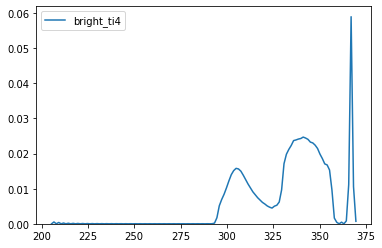

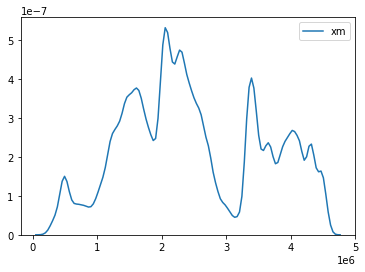

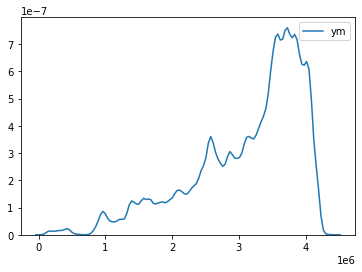

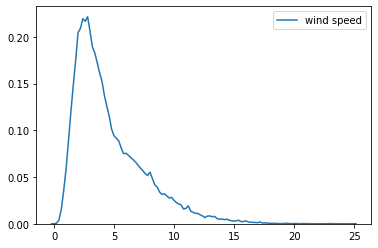

In [ ]:
for i in ['bright_ti4', 'xm', 'ym', 'wind speed']:
  sns.kdeplot(df[i])
  plt.show()

col_names = []
for key in df_nn:
  col_names.append(key)

features = X_train[col_names]
features2 = X_test[col_names]

ct = ColumnTransformer([('standard', StandardScaler(),
                         ['wind speed', 'bright_ti4', 'xm', 'ym'])], remainder='passthrough')
X_train = ct.fit_transform(features)
X_test = ct.transform(features2)

The baseline model was created based on rules of thumb found on [this](https://towardsdatascience.com/17-rules-of-thumb-for-building-a-neural-network-93356f9930af) article. The model contained three layers with 64, 32 and 16 neurons respectively and an output layer of 9 neurons with relu activation functions for all but the output layer, which was softmax. We used the 'Adam' optimiser and didn't use any dropout.

The results were satisfactory (~90% accuracy) but we decided to improve our model further by using Hyperparameter tuning.
 
The model displayed below (get_compiled_model) is our final model. Parameters were tuned with a hyperopt [wrapper](https://github.com/maxpumperla/hyperas), using the 'Tree of Parzen' algorithm. For in-depth explanations see [hyperparameter-section](https://colab.research.google.com/drive/16_nbPpnkGywcHkts1MW41sEFu9K5dVps#scrollTo=X6JcxKVDt4yN) below.

As we are working with a multi-class classification problem as well as with a softmax activation function, we use categorical cross-entropy as a loss function (Goodfellow et al.,2016). Using this function, the neural network outputs a probability that a fire pixel belongs to a specific category of fire intensity.

In [ ]:
def get_compiled_model():
  model = tf.keras.Sequential([
    tf.keras.layers.Dense(256, input_shape=(148,), activation = 'sigmoid'),
    tf.keras.layers.Dropout(0.03268490152025372),
    tf.keras.layers.Dense(64, activation = 'relu'),
    tf.keras.layers.Dropout(0.008909307568613745),
    tf.keras.layers.Dense(32, activation = 'relu'),
    tf.keras.layers.Dropout(0.42251493823699554),
    tf.keras.layers.Dense(32, activation = 'sigmoid'),
    tf.keras.layers.Dropout(0.30543815464061785),e
    tf.keras.layers.Dense(9, activation = 'softmax')])
  
  Adamax = tf.keras.optimizers.Adamax(learning_rate = 0.001)

  model.compile(optimizer=Adamax,
                loss= 'categorical_crossentropy',
                metrics=['accuracy'])
  
  return model

model = get_compiled_model()

In [ ]:
df['categorical'].value_counts()

6    2239173
7    1801240
5    1371184
2    1131825
3    1103122
9     982399
4     525163
8     134938
1       8223
Name: categorical, dtype: int64

As it can be seen in the previous code chunck, fire classes are very unbalanced. Ths risk is therefore that the network learns from the most common observation and will wrongly predict other other fire categories having a lower observation count.

To tackle this issue, we use the 'compute_sample_weight' function from scikit learn so as to balance out these effects. It estimates the sample weights by class for unbalanced datasets.

In [ ]:
sample_weights = compute_sample_weight('balanced', Y_train)

[EarlyStopping](https://machinelearningmastery.com/early-stopping-to-avoid-overtraining-neural-network-models/) is utilized to avoid needlessy training the model but use a fairly high patience to avoid stopping to be too early.

We fit the model with the parameters that we obtained during the hyperparameter-tuning process before. We use 20% of the training dataset as a validation dataset so as to provide an unbiased evaluation of a model fit.

In [ ]:
monitor_val_acc = EarlyStopping(monitor='val_accuracy', patience=15, verbose=1)
history = model.fit(X_train, Y_train, epochs = 50, batch_size = 64, validation_split = 0.2,
                    callbacks=[monitor_val_acc],
                    sample_weight = sample_weights)
preds = model.predict(X_test)
preds_rounded = np.round(preds)
print("Accuracy: ", np.mean(history.history['accuracy']))
print("Val Accuracy: ", np.mean(history.history['val_accuracy']))
print("Loss: ", np.mean(history.history['loss']))
print("Val_loss: ", np.mean(history.history['val_loss']))

The evaluation of the model is used to provide a performance metric of the fitting of the model on data it has never seen before.

In [ ]:
accuracy = model.evaluate(X_test, Y_test)
print('Accuracy:', accuracy)

37500/37500 [==============================] - 38s 1ms/step - loss: 0.0656 - accuracy: 0.9745
Accuracy: [0.0656166598200798, 0.9744566679000854]


The results demonstrate that the accuracy on data is 97.4%, while the loss is 0.06. To check the robustness of these findings we conduct further analyses below.

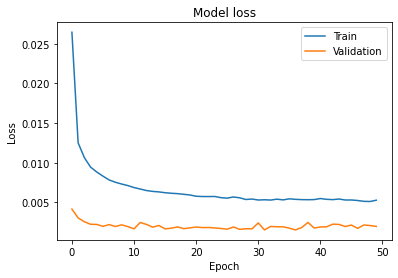

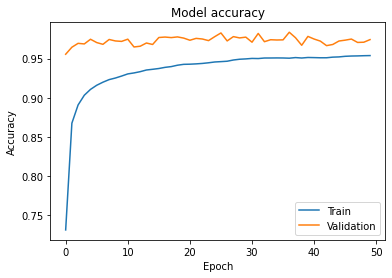

In [ ]:
def plot_loss(loss,val_loss):
  plt.figure()
  plt.plot(loss)
  plt.plot(val_loss)
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Validation'], loc='upper right')
  plt.show()

def plot_accuracy(acc,val_acc):
  plt.figure()
  plt.plot(acc)
  plt.plot(val_acc)
  plt.title('Model accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Validation'], loc='lower right')
  plt.show()

plot_loss(history.history['loss'], history.history['val_loss'])
plot_accuracy(history.history['accuracy'], history.history['val_accuracy'])

These graphs help visualising the training process. The train mimics a [perfect](https://towardsdatascience.com/understanding-learning-rates-and-how-it-improves-performance-in-deep-learning-d0d4059c1c10) training curve.

Usually, however, for a well-trained model, training and validation accuracy as well as loss converge smoothly, which is not observed here. This is due to the fact that we use dropout so as to prevent overfitting and provide a greater generalisation of the model on unseen data.

When the model is trained, a percentage of the features are randomly set to 0. When testing, all features are used. Therefore, accuracy is higher during validation than during training and loss is lower during validation than during training.

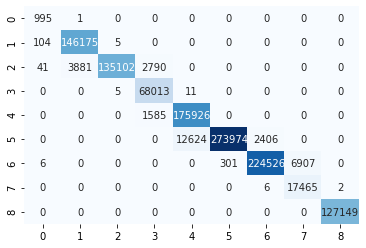

In [ ]:
cm = confusion_matrix(np.argmax(np.array(Y_test), axis=1), np.argmax(preds_rounded, axis=1))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

The confusion matrix is a performance metrics that is able to rate the correctness of the model's predictions.

The numbers in the diagonal represent the number of correct predictions of the model using the test dataset, i.e. true positives, whereas the number in other cells are those uncorrectly predicted by the model, i.e. false positives or false negatives.

The following code chunk uses the remaining 40% of the dataset as an additional sanity check. The data was transformed using the same previous techniques.

103040/103040 [==============================] - 109s 1ms/step - loss: 0.0657 - accuracy: 0.9744
Accuracy: [0.06570754945278168, 0.974412739276886]


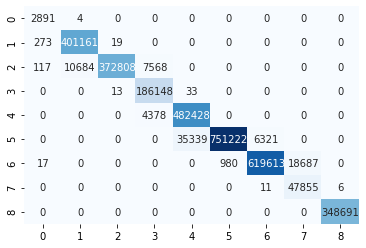

In [ ]:
df_pred = df[n:]
Y = df_pred['categorical'].values
df_pred = df_pred.drop(['categorical'], axis = 1)
Y = pd.get_dummies(pd.DataFrame(Y)[0].astype(str))

col_names = []
for key in df_pred:
  col_names.append(key)

features = df_pred[col_names]

ct = ColumnTransformer([('standard', StandardScaler(),
                         ['wind speed', 'bright_ti4', 'xm', 'ym'])], remainder='passthrough')

df_pred = ct.fit_transform(features)
accuracy = model.evaluate(df_pred, Y)
print('Accuracy:', accuracy)
preds = model.predict(df_pred)
preds_rounded = np.round(preds)
cm = confusion_matrix(np.argmax(np.array(Y), axis=1), np.argmax(preds_rounded, axis=1))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

This confusion matrix is the final evaluation of the performance of the model. Indeed, the data used has never been seen by the model.

## Hyperparameter tuning

In this last cell, we optimise the hypermarameters of the model to best suit our data. To do so, we use the "Hyperas" wrapper which allows us to use [hyperopt](https://conference.scipy.org/proceedings/scipy2013/pdfs/bergstra_hyperopt.pdf) (Bergstra et al., 2013) without needing to learn the required syntax. The wrapper works as follows :

A function (data) that returns x_train, y_train, x_test and y_test is created. This needs to be done, as we are using a wrapper. Then, all the different options are fed to the wrapper using {{choice[ ]}}. The script then evaluates the best combination of hyperparameters. The results are then fed back into the model we created earlier.

We previously experimented with multiple activation functions and concluded that "relu" and "sigmoid" were very good performers. We therefore let the algorithm decide which one was best, given our data. We followed a similar procedure regarding the optimiser. We discarded "RMSprop", "SGD", "adagrad" and "adadelta" and concluded that the best ones were "adam", "nadam" and "adamax", which were all performing very similarly ([Ruder, 2016](https://arxiv.org/pdf/1609.04747.pdf)).

We chose "validation_acc" because we are interested in the best possible accuracy of the model. Moreover, in the following code, we use "loss : - validation_acc" because hyperopt minimises any metric we provide.

The output of the wrapper is as follows :

*Best performing model chosen hyper-parameters:
{'Activation': 1, 'Activation_1': 0, 'Activation_2': 0, 'Activation_3': 1, 'Dense': 3, 'Dense_1': 1, 'Dense_2': 0, 'Dense_3': 0, 'Dropout': 0.03268490152025372, 'Dropout_1': 0.008909307568613745, 'Dropout_2': 0.42251493823699554, 'Dropout_3': 0.30543815464061785, 'batch_size': 1, 'lr': 2, 'lr_1': 0, 'lr_2': 1, 'opti_choice': 2}*

1. Activation_x refers to the activation function of each layer x and the number following the colon represents the index of the list fed to the algorithm.
2. Dense_x refers to each layer x and the number following the colon represents the index of the list fed to the algorithm.
3. Dropout_x corresponds to each dropout used in the model and the number following the colon represents its value.
4. Batch_size : 1 refers to the second element of the list provided to the script.
5. The algorithm yields different learning rates for different optimisers but since we only use one optimiser, we are solely interested in "lr_2", which represents the optimal learning rate of the best optimiser.



In [ ]:
def data():
  
  df = pd.read_csv('/content/df/df.csv').drop(['Unnamed: 0'], axis=1)
  
  f = df['wind direction'].values
  a = []
  for i in range(0, len(f)):
    if 348.75<f[i]<=360:
      a.append('N')
    elif 0<f[i]<=11.25:
      a.append('N')
    elif 11.25<f[i]<=33.75:
      a.append('NNE')
    elif 33.75<f[i]<=56.25:
      a.append('NE')
    elif 56.25<f[i]<=78.75:
      a.append('ENE')
    elif 78.75<f[i]<=101.25:
      a.append('E')
    elif 101.25<f[i]<=123.75:
      a.append('ESE')
    elif 123.75<f[i]<=146.25:
      a.append('SE')
    elif 146.25<f[i]<=168.75:
      a.append('SSE')
    elif 168.75<f[i]<=191.25:
      a.append('S')
    elif 191.25<f[i]<=213.75:
      a.append('SSW')
    elif 213.75<f[i]<=236.25:
      a.append('SW')
    elif 236.25<f[i]<=258.75:
      a.append('WSW')
    elif 258.75<f[i]<=281.25:
      a.append('W')
    elif 281.25<f[i]<=303.75:
      a.append('WNW')
    elif 303.75<f[i]<=326.25:
      a.append('NW')
    elif 326.25<f[i]<=348.75:
      a.append('NNW')
  Onehot = pd.get_dummies(pd.DataFrame(a, columns = ['']))

  Onehot_1 = pd.DataFrame(to_categorical(df['month']),
              columns=[0,'January', 'February', 'March', 'April', 'May',
                        'June', 'July', 'August', 'September', 'October',
                        'November', 'December']).drop(0, axis = 1)

  Onehot_2 = pd.get_dummies(pd.DataFrame(df['FEATTYPE']))

  Onehot_3 = pd.get_dummies(pd.DataFrame(df['cluster'].astype(str)))

  df = pd.concat([df.reset_index(), Onehot.reset_index(),
                  Onehot_1.reset_index(), Onehot_2.reset_index(), Onehot_3.reset_index()],
                axis = 1).drop(['index', 'month', 'FEATTYPE', 'wind direction', 'cluster'], axis = 1)

  df['day_night'] = df['day_night'].astype(int)
  df['confidence'] = df['confidence'].astype(int)
  df['categorical'] = df['categorical'].astype(int)

  df = df.drop(['latitude', 'longitude', 'geometry'], axis = 1)
  df = shuffle(df).reset_index().drop('index', axis = 1)

  n =  5000000
  df_nn = df[:n]
  df_pred = df[n:]

  Y = df_nn['categorical'].values
  df_nn = df_nn.drop(['categorical'], axis = 1)
  Y = pd.get_dummies(pd.DataFrame(Y)[0].astype(str))

  x_train, x_test, y_train, y_test = train_test_split(df_nn, Y, test_size=0.2)
  
  col_names = []
  for key in df_nn:
    col_names.append(key)

  features = x_train[col_names]
  features2 = x_test[col_names]
  
  ct = ColumnTransformer([('ct_stud', StandardScaler(), ['bright_ti4', 'xm', 'ym', 'wind speed'])], remainder='passthrough')
  x_train = ct.fit_transform(features)
  x_test = ct.transform(features2)

  return x_train, y_train, x_test, y_test

def create_model(x_train, y_train, x_test, y_test):
  
  model = Sequential()
  model.add(Dense({{choice([32, 64, 128, 256, 512, 1024])}}, input_shape= (148,)))
  model.add(Activation({{choice(['relu', 'sigmoid'])}}))
  model.add(Dropout({{uniform(0, .5)}}))
  model.add(Dense({{choice([32, 64, 128, 256, 512, 1024])}}))
  model.add(Activation({{choice(['relu', 'sigmoid'])}}))
  model.add(Dropout({{uniform(0, .5)}}))
  model.add(Dense({{choice([32, 64, 128, 256, 512, 1024])}}))
  model.add(Activation({{choice(['relu', 'sigmoid'])}}))
  model.add(Dropout({{uniform(0, .5)}}))
  model.add(Dense({{choice([32, 64, 128, 256, 512, 1024])}}))
  model.add(Activation({{choice(['relu', 'sigmoid'])}}))
  model.add(Dropout({{uniform(0, .5)}}))
  model.add(Dense(9))
  model.add(Activation('softmax'))

  adam = tf.keras.optimizers.Adam(lr={{choice([0.0001, 0.001, 0.01, 0.1])}})
  nadam = tf.keras.optimizers.Nadam(lr={{choice([0.0001, 0.001, 0.01, 0.1])}})
  adamax = tf.keras.optimizers.Adamax(lr={{choice([0.0001, 0.001, 0.01, 0.1])}})
  
  opti_choice = {{choice(['adam', 'nadam', 'adamax'])}}
  if opti_choice == 'adam':
      optimizer = adam
  elif opti_choice == 'nadam':
      optimizer = nadam
  else:
      optimizer = adamax

  model.compile(loss='categorical_crossentropy', metrics=['accuracy'],
                optimizer=optimizer)
  
  early_stopping = EarlyStopping(monitor='val_accuracy', patience=15, verbose=1)

  result = model.fit(x_train, y_train,
            batch_size={{choice([32, 64, 128])}},
            epochs=50,
            verbose=2,
            validation_split=0.1,
            callbacks = [early_stopping],
            sample_weight = compute_sample_weight('balanced', y_train))

  validation_acc = np.amax(result.history['val_accuracy']) 
  print('Best validation acc of epoch:', validation_acc)
  return {'loss': -validation_acc, 'status': STATUS_OK, 'model': model}


if __name__ == '__main__':
  best_run, best_model = optim.minimize(model=create_model,
                                        data=data,
                                        algo=tpe.suggest,
                                        max_evals=1,
                                        trials=Trials(),
                                        notebook_name = 'drive/My Drive/Colab Notebooks/data science')
  X_train, Y_train, X_test, Y_test = data()
  print("Evalutation of best performing model:")
  print(best_model.evaluate(X_test, Y_test))
  print("Best performing model chosen hyper-parameters:")
  print(best_run)

# Robustness analysis

In this section, we briefly discuss the sanity checks that have been done throughout the process of coding this project to ensure the best possible accuracy and robustness.

## Confidence parameter

To avoid misvisualisation and misclassification of fires, we include the confidence variable, which is a measure of the probability of avoiding a false positive. Indeed, each fire point has a degree of confidence. Low confidence is potencially associated with sun glint as well as lower temperature fires.

## Hyperparameter tuning

As described in the section "hyperparameter tuning", we use the Tree of Parzen algorithm to optimise the number of neurons for each layer, the activation function of each layer as well as the dropouts rate and optimiser. This is to ensure that the chose parameters correspond to the data as much as possible.

## Class weights

The data that we obtained is very unbalanced regarding fire severity. Indeed, low severity fires are much more scarse than higher severity fires. To avoid incorrect predictions, we use a specific function to adjust the weights according to the balancedness of the dataset. This has the effect of lowering the rate of false positives.

## Prediction dataset

Due to the size of our dataset, we were able to split it between a working dataset and a "sanity check" dataset. The latter is used to test the final model's performance on data it has never seen before. The accuracy is higher than 97%, the loss is lower than .066 and the false positive rate is very low, which shows that the model is very accurate.

## Dropout

As explained in the "model creation" section, we use dropout so as to increase the generalisation of the model on unseen data as well as to prevent the model from overfitting (Srivastava et al., 2014). Dropout randomly sets the output of a neuron to $0$.

# Conclusion

In this assignment, we explore predictive accuracy and find that a neural network trained on fire, wind and vegetation data obtained through satellite imagery from different sources can very accurately (>97%) predict wildfire severity in Australia. Such accuracy is achieved by using a hyperparameter-tuned algorithm. Using sample-weights, we correct for biases stemming from the unbalancedness of the data and produce a satisfactory confusion matrix with a very low rate of false positives and false negatives. Dropout is used to make the model more robust and generalisable.

Although our model produces accurate results, features such as ambient temperature, terrain slope and precipitation data could be incorporated in future research so as to obtain a more generalisable model that mitigates strongly misclassified predictions by producing a lower rate of false positives and false negatives. Moreover, to merge fire and wind data, fire clusters that have irregular shape were used, therefore increasing the risk that a wind point was attributed to an incorrect cluster.

Furthermore, spacial autocorrelation, i.e. the risk that two observations close to each other have the same value could distort the independency from one another. This shortcoming may be adressed by incorporating spacial autocorrelation measures such as "Moran's 1" (Getis, 2008).

Finally, the analysis was based on a probability that a fire point is an actual fire and not a sun reflection which may decrease the truthfulness of the results.

# References
- Bergstra, J. S., Bardenet, R., Bengio, Y., & Kégl, B. (2011). Algorithms for hyper-parameter optimization. In Advances in neural information processing systems (pp. 2546-2554). [Link.](https://papers.nips.cc/paper/4443-algorithms-for-hyper-parameter-optimization.pdf)

- Bergstra, J., Yamins, D., & Cox, D. D. (2013, June). Hyperopt: A python library for optimizing the hyperparameters of machine learning algorithms. In Proceedings of the 12th Python in science conference (pp. 13-20). Citeseer. [Link.](https://conference.scipy.org/proceedings/scipy2013/pdfs/bergstra_hyperopt.pdf)

- Collins, Luke & Griffioen, P. & Newell, Graeme & Mellor, Andrew. (2018). The utility of Random Forests for wildfire severity mapping. Remote Sensing of Environment. 216. 374-384. doi: 10.1016/j.rse.2018.07.005.

- Getis, Arthur. (2008). A History of the Concept of Spatial Autocorrelation: A Geographer's Perspective. Geographical Analysis. 40. 297 - 309. 10.1111/j.1538-4632.2008.00727.x. 

- Goodfellow, I., Bengio, Y., & Courville, A. (2016). Deep learning. MIT press.

- Hantson, S., Pueyo, S. and Chuvieco, E. (2015), Spatial trends in global fire size distribution. Global Ecology and Biogeography, 24: 77-86. doi:10.1111/geb.12246

- Kaufman, Y. & Ichoku, Charles & Giglio, L. & Korontzi, S. & Chu, D. & Hao, W. & Li, R.-R & Justice, C.. (2003). Fire and smoke observed from the Earth Observing System MODIS instrument--products, validation, and operational use. International Journal of Remote Sensing - INT J REMOTE SENS. 24. 1765-1781. 10.1080/01431160210144741. 

- MacQueen, J. (1967, June). Some methods for classification and analysis of multivariate observations. In Proceedings of the fifth Berkeley symposium on mathematical statistics and probability (Vol. 1, No. 14, pp. 281-297).

- Muralidharan, K.. (2010). A Note on Transformation, Standardization and Normalization. [Link.](https://www.researchgate.net/publication/256005221_A_Note_on_Transformation_Standardization_and_Normalization)

- Potdar, Kedar & Pardawala, Taher & Pai, Chinmay. (2017). A Comparative Study of Categorical Variable Encoding Techniques for Neural Network Classifiers. International Journal of Computer Applications. 175. 7-9. 10.5120/ijca2017915495. 

- Romanescu, Vlad (2020). The application of Machine Learning in predicting burn severity in British Columbia's Cariboo region. University of British Columbia. Retrieved from https://bit.ly/3b10yy9 [3.5.2020]

- Ruder, S. (2016). An overview of gradient descent optimization algorithms. arXiv preprint arXiv:1609.04747. [Link.](https://arxiv.org/pdf/1609.04747.pdf)

- Running, S. W. (2006). Is Global Warming Causing More, Larger Wildfires? Science, 313(5789), 927-928, https://doi.org/10.1126/science.1130370

- Schroeder, Wilfrid & Oliva, Patricia & Giglio, Louis & Csiszar, Ivan. (2014). The New VIIRS 375 m active fire detection data product: Algorithm description and initial assessment. Remote Sensing of Environment. 143. 85–96. 10.1016/j.rse.2013.12.008. 

- Srivastava, N., Hinton, G., Krizhevsky, A., Sutskever, I., & Salakhutdinov, R. (2014). Dropout: a simple way to prevent neural networks from overfitting. The journal of machine learning research, 15(1), 1929-1958.
